In [ ]:
import os
import sys
import shutil
import h5py
import numpy as np
from astropy.nddata.utils import Cutout2D
from astropy.io import fits
from astropy.table import Table
import pandas as pd
import matplotlib.pyplot as plt
from astropy.visualization import (ZScaleInterval, ImageNormalize)
import tensorflow as tf
from tensorflow import keras
from sklearn.utils import shuffle
import umap
from sklearn.preprocessing import StandardScaler
from astropy.wcs import WCS,utils
from keras_tuner import RandomSearch
%load_ext autoreload
sys.path.append('../')
from functions import *
from create_models import *

In [ ]:
with open ('eval_tiles.list', 'r') as f:
    evaluated = [row for row in csv.reader(f,delimiter=',')]
evaluates = new_cat[0]

# Debugging

In [2]:
new_tiles = []
for i in np.array(pd.read_csv('cutouts/broken_tiles.csv').T)[0]:
    if 'r' in list(i) or 'u' in list(i):
        new_tiles.append(i)

FileNotFoundError: [Errno 2] No such file or directory: 'cutouts/broken_tiles.csv'

In [ ]:
for i in list(pd.read_csv('cutouts/broken_tiles.csv'):
     if 'r' in list(i) or 'u' in list(i):
        print(i)

In [ ]:
image_dir = "/home/anahoban/projects/rrg-kyi/astro/cfis/W3/"

In [ ]:
import os
tile_id = '229.294'

tile_name =  'CFIS.' + tile_id + '.r'  + ".fits"
#FILES
#files
# Load the image and the WCS
img_slurm = os.path.abspath(image_dir +'/'+ tile_name )
img_fits = fits.open(img_slurm, memmap=True)[0]
print('opened file')
wcs = WCS(img_fits.header)
                
# Make the cutout, including the WCS
x=8939.309733318474
y=426.1345338456931
cutout = Cutout2D(img_fits.data, position=(x,y), size=cutout_size, wcs=wcs)

# Put the cutout image in the FITS HDU
#img_fits.data = cutout.data

# Update the FITS header with the cutout WCS
#img_fits.header.update(cutout.wcs.to_header())


In [ ]:
cutout.data

# Positive examples: Cutouts with arcs

In [4]:
import csv
with open ('../arcs_list.csv', 'r') as f:
    arcs = [row[0] for row in csv.reader(f,delimiter='\t')]

In [5]:
arc_tiles= []

for tile in arcs:
    if '~' not in tile.split(' '):
        arc_tiles.append(tile.split(' ')[0][:-2])

In [6]:
print('tiles with visible arcs:', len(arc_tiles))

tiles with visible arcs: 295


In [7]:
#candidates fit files
arc_dir = os.path.expandvars("$SCRATCH") + "/" + 'all_cand/'
all_cand = os.listdir(arc_dir)
cand_64 = []
for i in all_cand:
    if 'cutout' in i.split('_'):
        cand_64.append(i)

In [8]:
arc_tiles = list(set(list(arc_tiles))) #remove duplicates if any
to_remove = ['254.243', '225.272', '081.185', '229.297', '012.180', '019.195', '682.206', '641.184',
             '440.224', '031.179', '711.180', '363.184', '269.246', '345.243', '380.255', '348.181',
             '630.185', '073.181', '337.236', '064.184', '013.187', '323.224', '339.228', '011.184',
             '056.190', '053.188', '053.190', '326.224', '628.189', '044.180', '048.180', '034.186',
             '046.187', '642.204', '407.244', '672.195', '250.286', '615.235', '033.184', '016.203',
             '020.181', '351.245', '358.266', '193.247', '219.286', '007.229', '212.275', '203.248',
             '224.255', '356.267', '441.224', '679.187', '314.240', '426.222']
to_remove_qso = ['070.320', '243.290', '205.300', '253.283', '374.267', '389.267', '118.295', '330.260']
[arc_tiles.remove(i) for i in to_remove_qso+to_remove]
index_dict = {k:v for v,k in enumerate(arc_tiles)}

In [9]:
inv_dict = {v: k for k, v in index_dict.items()}

In [10]:
num_cand = len(inv_dict)

In [11]:
#all arc candidates
arcs_array = np.zeros((num_cand,64,64,2))#both u and r channels
cutout_size= 64
i=0
for tile in arc_tiles:
        
    u_cut = 'CFIS.' + tile + '.u_cutout_0.fits' 
    r_cut = 'CFIS.' + tile + '.r_cutout_0.fits' 
    if u_cut in all_cand:
        img_u = fits.open(arc_dir + u_cut, memmap=True)[0].data  
        
        #normalize
        img_lower = np.percentile(img_u, 0.001)
        img_upper = np.percentile(img_u, 99.999)

        img_u[img_u<img_lower] = img_lower
        img_u[img_u>img_upper] = img_upper

        if img_lower == img_upper:
            img_norm_u = np.zeros((cutout_size, cutout_size))
        else:
            img_norm_u = (img_u - np.min(img_u)) / (img_upper - img_lower)
           
        if img_u.shape == (64,64): #some are cut
            arcs_array[index_dict[tile],...,0] = img_norm_u
        
        else: 
            continue
            
    if r_cut in all_cand:
        img_r = fits.open(arc_dir + r_cut, memmap=True)[0].data          
        
        #normalize
        img_lower = np.percentile(img_r, 0.001)
        img_upper = np.percentile(img_r, 99.999)

        img_r[img_r<img_lower] = img_lower
        img_r[img_r>img_upper] = img_upper

        if img_lower == img_upper:
            img_norm_r = np.zeros((cutout_size, cutout_size))
        else:
            img_norm_r = (img_r - np.min(img_r)) / (img_upper - img_lower)
           
        if img_r.shape == (64,64): #some are cut
            arcs_array[index_dict[tile],...,1] = img_norm_r
        
        else: 
            continue
    i+=1
print(i == num_cand-1, '--> should be true')      


True --> should be true


In [12]:
print(num_cand)

232


In [33]:
arcs_array = all_arcs
fig, ax = plt.subplots(25*2, 10, figsize=(10*8, 25*2*8))

for i in range(25*2):
    ax[i][0].imshow(arcs_array[5*i,...,0])
    ax[i][1].imshow(arcs_array[5*i,...,1])
    ax[i][2].imshow(arcs_array[5*i+1,...,0])
    ax[i][3].imshow(arcs_array[5*i+1,...,1])
    ax[i][4].imshow(arcs_array[5*i+2,...,0])
    ax[i][5].imshow(arcs_array[5*i+2,...,1])
    ax[i][6].imshow(arcs_array[5*i+3,...,0])
    ax[i][7].imshow(arcs_array[5*i+3,...,1])
    ax[i][8].imshow(arcs_array[5*i+4,...,0])
    ax[i][9].imshow(arcs_array[5*i+4,...,1])
    
    ax[i][0].set_title('u, '+ inv_dict[5*i]  ,size = 50)                
    ax[i][1].set_title('r, '+ inv_dict[5*i]  ,size = 50)
    ax[i][2].set_title('u, '+ inv_dict[5*i+1], size = 50)                
    ax[i][3].set_title('r, '+ inv_dict[5*i+1], size = 50)
    ax[i][4].set_title('u, '+ inv_dict[5*i+2], size = 50)                
    ax[i][5].set_title('r, '+ inv_dict[5*i+2], size = 50)
    ax[i][6].set_title('u, '+ inv_dict[5*i+3], size = 50)                
    ax[i][7].set_title('r, '+ inv_dict[5*i+3], size = 50)
    ax[i][8].set_title('u, '+ inv_dict[5*i+4], size = 50)                
    ax[i][9].set_title('r, '+ inv_dict[5*i+4], size = 50)

IndexError: index 246 is out of bounds for axis 0 with size 246

# Create train, val and test sets

In [13]:
image_dir = "/home/anahoban/projects/rrg-kyi/astro/cfis/W3/"
label_dir = "/home/anahoban/anahoban/GravitationalLensing/Code/Batch Loading/Currently usedlabels/"
label_subdir = "stronglensdb_confirmed_unige/"

In [14]:
cutout_dir = os.path.expandvars("$SCRATCH") + "/"
hf = h5py.File(cutout_dir + "confirmed_cfis_64p.h5", "r")

In [4]:
hf.close()

### Run this only for dataset with all cand and confirmed lenses

In [12]:
num_cands = 0
for tile in hf.keys():
    cutouts = list(hf[tile+'/IMAGES'].keys())
    for cut in cutouts:
        if cut[-1] in ['r','u']:
            num_cands += 1

KeyboardInterrupt: 

In [ ]:
num_cands = 381 #computed in cell above
cutouts_size = 64

In [ ]:
#store all unused tiles in csv file
all_tiles = os.listdir(image_dir)

tiles_for_cuts = []
for name in all_tiles:
    if name.split('.')[0] == 'CFIS' and name.split('.')[1] +'.' + name.split('.')[2] not in arc_tiles:
        tiles_for_cuts.append(name.split('.')[1] + '.' + name.split('.')[2])

hist_tiles = pd.DataFrame(tiles_for_cuts, dtype = str) 

file_tiles_list = './cutouts/list_unused_tiles.csv'
with open(file_tiles_list, mode='a') as f:
    hist_tiles.to_csv(f)

In [15]:
#candidate cutouts
conf_cand = np.zeros((num_cands, 64 ,64 , 4)) #just need u and r for now
count = 0
for tile in hf.keys():
    cutouts = list(hf[tile+'/IMAGES'].keys())
    for cut in cutouts:
        if cut[-1] in ['r','u']:
            conf_cand[count,...,:2] = np.array(hf[tile+'/IMAGES/'+cut])[...,[0,2]]
            if np.isnan(np.sum(conf_cand[count,...,0])): #u is nan
                conf_cand[count,...,0] = np.random.normal(loc = 0.5,scale= 0.13, size=(cutout_size, cutout_size))
            if np.isnan(np.sum(conf_cand[count,...,1])): #r is nan
                conf_cand[count,:,:,1] = np.random.normal(loc = 0.5,scale= 0.13, size=(cutout_size, cutout_size))
            count += 1          
count == num_cands #should be True

True

---

In [15]:
num_cands = num_cand #computed from cell above
cutouts_size = 64

In [16]:
import random
import csv
#random cutouts (non-lenses for training)
#for now, we want the same number of candidates as non candidates
with open('../cutouts/cutouts_adresses.csv', newline='') as f:
    reader = csv.reader(f)    
    cutout_ids = list(reader)[0]

random.Random(5).shuffle(cutout_ids)

In [17]:
n = 1
num_rand = num_cands*n #number of random cutouts, ratio 1:n
rand_cuts = np.zeros((num_rand, 64 ,64 , 4)) #just need u and r for now
count = 0
for i in cutout_ids:
    tile, cut = i.split(' ')
    if cut[-1] not in ['r','u'] and count < num_rand:
        rand_cuts[count,...,:2 ] = np.array(hf[tile+'/IMAGES/'+cut])[...,[0,2]]
        count += 1
count == num_rand #should be True

True

In [18]:
all_arcs = np.concatenate( (arcs_array , np.zeros((num_cands,64,64,2)) ), axis=-1)

In [19]:
#replace zeros with noise
for n in range(len(all_arcs)):
    if np.all((all_arcs[n,...,0]==0)) :
        all_arcs[n,...,0] = np.random.normal(loc = 0.5,scale= 0.13, size=(64,64))
    if np.all((all_arcs[n,...,1]==0)) :
        all_arcs[n,...,1] = np.random.normal(loc = 0.5,scale= 0.13, size=(64,64))

In [20]:
#create label and full dataset
labels = np.concatenate((np.ones(num_cands),np.zeros(num_rand)))
#cutouts = np.concatenate((conf_cand, rand_cuts))
cutouts = np.concatenate((all_arcs, rand_cuts))

In [21]:
from sklearn.utils import shuffle
X, Y = shuffle(cutouts, labels, random_state=0)

In [22]:
#splitting 70:20:10
train_x, val_x, test_x = np.split(X, [int(.7*len(Y)), int(.9*len(Y))])
train_y, val_y, test_y = np.split(Y, [int(.7*len(Y)), int(.9*len(Y))])

In [26]:
#save datasets
import hickle as hkl
scratch = os.path.expandvars("$SCRATCH") +'/'
data = {'xtrain':train_x, 'xval': val_x,  'xtest': test_x, 'ytrain': train_y, 'yval': val_y, 'ytest':test_y}
hkl.dump(data, scratch + 'classifier_all_data.hkl')

### Loading the data

In [2]:
import hickle as hkl
scratch = os.path.expandvars("$SCRATCH") +'/'
array_hkl = hkl.load(scratch + 'classifier_all_data.hkl')

In [3]:
train_x = array_hkl['xtrain']
val_x   = array_hkl['xval']
test_x  = array_hkl['xtest']
train_y = array_hkl['ytrain']
val_y   = array_hkl['yval']
test_y  = array_hkl['ytest']

In [4]:
print('checking ratios')
print('test set:', len(test_y[test_y<0.5])/len(test_y[test_y>0.5]))
print('val set:', len(val_y[val_y<0.5])/len(val_y[val_y>0.5]))
print('train set:', len(train_y[train_y<0.5])/len(train_y[train_y>0.5]))


checking ratios
test set: 30.23076923076923
val set: 31.48
train set: 35.43589743589744


In [5]:
#checking in NAN
for cut in range(len(train_x)):
        if np.isnan(np.sum(train_x[cut])) == True:
            print('NAN found in training set, index', cut) 

## Attempt at Color Images

In [8]:
from astropy.visualization import (ZScaleInterval, ImageNormalize)
from astropy.visualization import make_lupton_rgb
from astropy.visualization import simple_norm

In [9]:
cutout = arcs_array[4]
cutout_r = cutout[:,:,1] #r
cutout_g = np.zeros((64,64))#cutout[:,:,1]
cutout_b = cutout[:,:,0] #u

#norm = simple_norm(cutout_rgb, 'sqrt')
norm_r = ImageNormalize(cutout_r, interval=ZScaleInterval()) #, vmax = 30, vmin =10)
norm_g = ImageNormalize(cutout_g, interval=ZScaleInterval()) #, vmax = 30, vmin =10)
norm_b = ImageNormalize(cutout_b, interval=ZScaleInterval()) #, vmax = 30, vmin =10)


cutout_rgb = make_lupton_rgb(norm_r(cutout_r), cutout_g, norm_b(cutout_b), Q=10, stretch=0.5)

plt.imshow(cutout_rgb)

# plt.imshow(cutout_rgb)

NameError: name 'arcs_array' is not defined

In [ ]:
fig, ax = plt.subplots(29, 10, figsize=(10*8, 29*8))

for i in range(29):
    ax[i][0].imshow(arcs_array[5*i,...,0])
    ax[i][1].imshow(arcs_array[5*i,...,1])
    ax[i][2].imshow(arcs_array[5*i+1,...,0])
    ax[i][3].imshow(arcs_array[5*i+1,...,1])
    ax[i][4].imshow(arcs_array[5*i+2,...,0])
    ax[i][5].imshow(arcs_array[5*i+2,...,1])
    ax[i][6].imshow(arcs_array[5*i+3,...,0])
    ax[i][7].imshow(arcs_array[5*i+3,...,1])
    ax[i][8].imshow(arcs_array[5*i+4,...,0])
    ax[i][9].imshow(arcs_array[5*i+4,...,1])
    
    ax[i][0].set_title('u, '+ inv_dict[5*i]  ,size = 50)                
    ax[i][1].set_title('r, '+ inv_dict[5*i]  ,size = 50)
    ax[i][2].set_title('u, '+ inv_dict[5*i+1], size = 50)                
    ax[i][3].set_title('r, '+ inv_dict[5*i+1], size = 50)
    ax[i][4].set_title('u, '+ inv_dict[5*i+2], size = 50)                
    ax[i][5].set_title('r, '+ inv_dict[5*i+2], size = 50)
    ax[i][6].set_title('u, '+ inv_dict[5*i+3], size = 50)                
    ax[i][7].set_title('r, '+ inv_dict[5*i+3], size = 50)
    ax[i][8].set_title('u, '+ inv_dict[5*i+4], size = 50)                
    ax[i][9].set_title('r, '+ inv_dict[5*i+4], size = 50)

---
# Getting latent space + u-mapping og data and latent space rep


In [25]:
#data for training classifier!!
len_test = len(test_x)

In [24]:
bands = 2
def MSE_with_uncertainty(y_true, y_pred): 
    weights = y_pred[...,bands:] 
    y_pred_image = y_pred[...,:bands]
    
    return K.square(tf.math.multiply((y_true - y_pred_image), weights) )

model_path = "../../Models/job15.h5"
autoencoder_cfis = keras.models.load_model(model_path, custom_objects={'MSE_with_uncertainty': MSE_with_uncertainty})
encoder = keras.Model(autoencoder_cfis.input, autoencoder_cfis.layers[7].output)

In [7]:
#!pip freeze | grep h5py

In [8]:
#!pip install -Iv h5py==2.10.0 

--- 

In [26]:
import sklearn.datasets
import pandas as pd
import numpy as np
import umap.umap_ as umap
import seaborn as sns

from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

In [17]:
#sns.set_theme(context='poster', rc={'figure.figsize':(7,5)}, palette = sns.color_palette())

#### on cutouts

In [27]:
#2d
len_train =  len(train_y)
reducer = umap.UMAP(random_state=42)
mapper =reducer.fit(train_x.reshape(len_train,64*64*4))
embedding = reducer.transform(train_x.reshape(len_train,64*64*4))

data = train_x.reshape(len_train,64*64*4)

In [28]:
data_list = train_y
def draw_umap(data, n_neighbors=15, min_dist=0.1, n_components=2, metric='euclidean', title=''):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric
    )
    u = fit.fit_transform(data);
    fig = plt.figure()
    if n_components == 1:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], range(len(u)), c=data_list)
    if n_components == 2:
        ax = fig.add_subplot(111)
        ax.scatter(u[:,0], u[:,1], c=data_list)
    if n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(u[:,0], u[:,1], u[:,2], c=data_list, s=100)
    plt.title(title, fontsize=18)

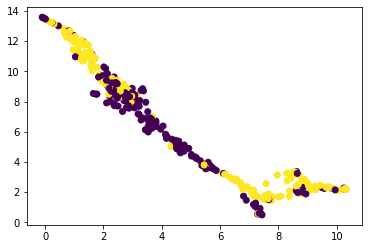

In [29]:
plt.scatter(embedding[:,0], embedding[:,1], c=train_y)

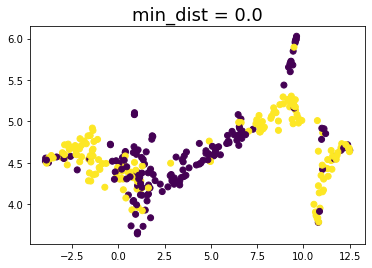

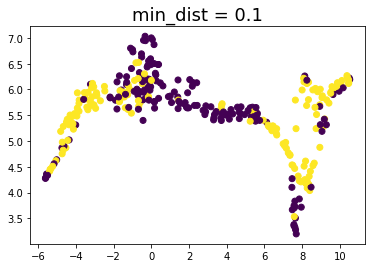

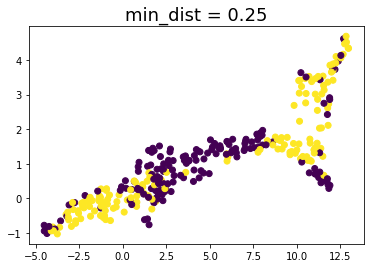

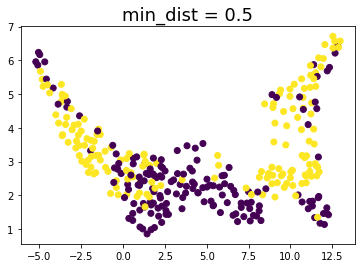

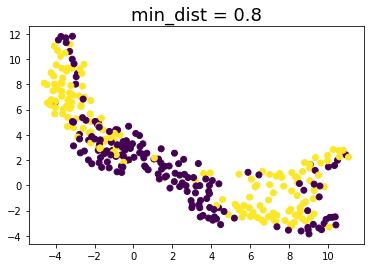

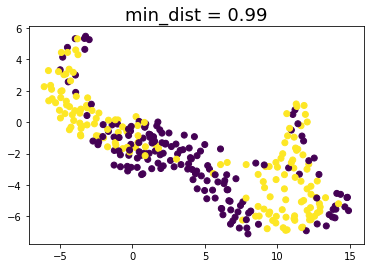

In [30]:
for d in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
    draw_umap(data, min_dist=d, title='min_dist = {}'.format(d))

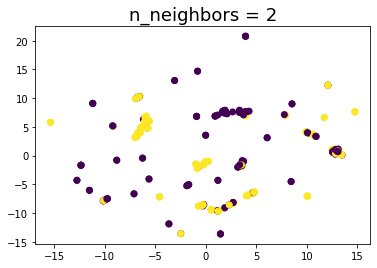

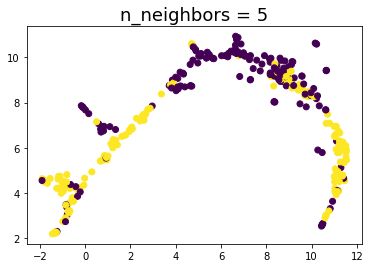

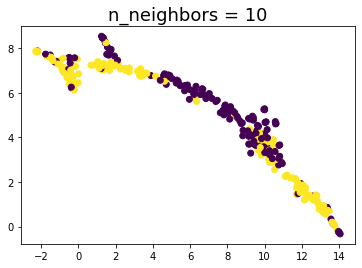

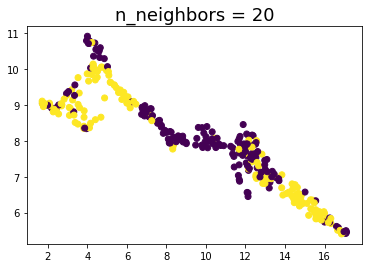

In [31]:
for n in (2, 5, 10, 20):
    draw_umap(data, n_neighbors=n, title='n_neighbors = {}'.format(n))

---
## on latent space

In [32]:
latent_x = encoder.predict(train_x)
len_tain= len(latent_x)
data = latent_x.reshape(len_train,64*64*32)

In [33]:
#2d
reducer = umap.UMAP(random_state=42)
mapper =reducer.fit(latent_x.reshape(len_train,64*64*32))
embedding = reducer.transform(latent_x.reshape(len_train,64*64*32))

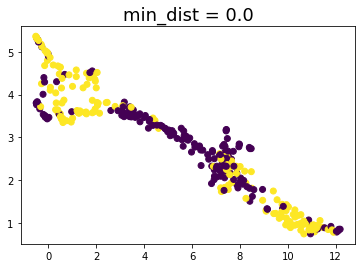

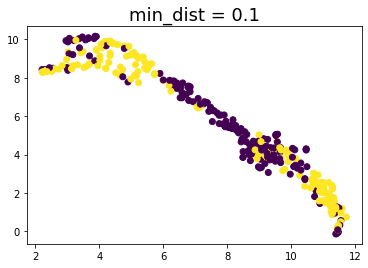

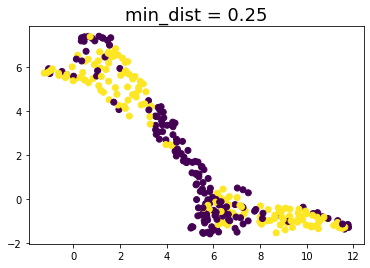

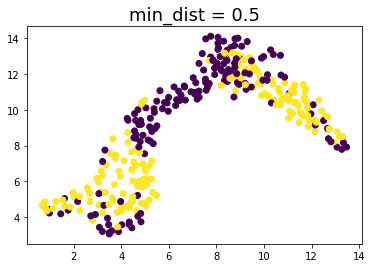

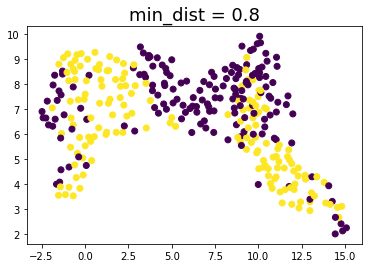

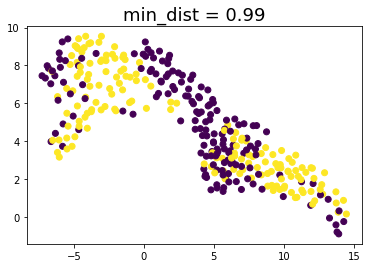

In [34]:
for d in (0.0, 0.1, 0.25, 0.5, 0.8, 0.99):
    draw_umap(data, min_dist=d, title='min_dist = {}'.format(d))

/home/anahoban/umap/lib/python3.8/site-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


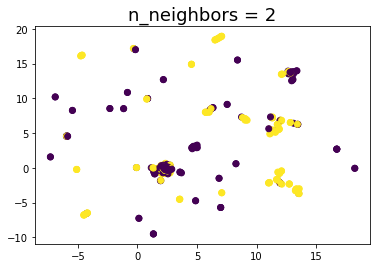

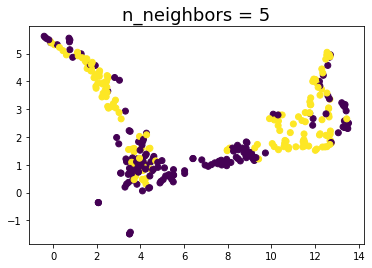

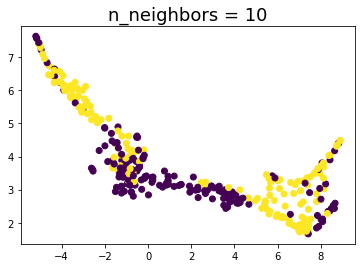

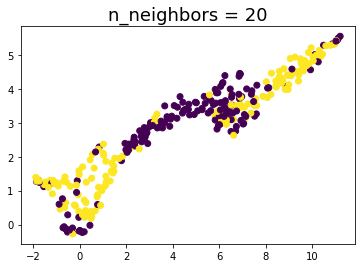

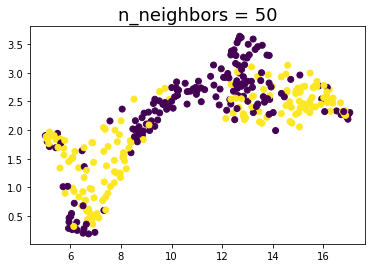

In [35]:
data_list = train_y
for n in (2, 5, 10, 20, 50):
    draw_umap(data, n_neighbors=n, title='n_neighbors = {}'.format(n))

In [36]:
%matplotlib widget
draw_umap(data, n_neighbors=5, n_components=3, title='n_components = 3')

ModuleNotFoundError: No module named 'ipympl'

--- 
# Data Augmentation

In [5]:
import random
def rotation(array):
    rand = random.random()
    if rand < 1/3:
        return np.rot90(array, k=1, axes=(0,1))
    elif rand > 2/3:
        return np.rot90(array, k=2, axes=(0,1))
    else:
        return array
    

In [6]:
ex = rotation(train_x[0,...])

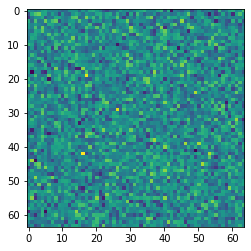

In [7]:
%matplotlib inline
plt.imshow(ex[...,1])

In [8]:
#create data generator
datagen = keras.preprocessing.image.ImageDataGenerator(
            width_shift_range=5,
            height_shift_range=5,
            #zoom_range=0.2,
            horizontal_flip=True,
            vertical_flip = True,
            preprocessing_function = rotation
            )
#create iterator (in train_classifier fct)
it = datagen.flow(train_x,batch_size=1)

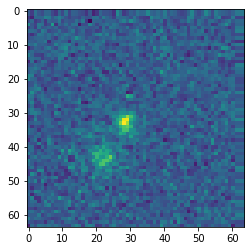

In [9]:
plt.imshow(it.next()[0,...,1])

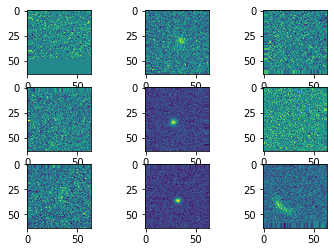

In [10]:
# generate samples and plot
for i in range(9):
	# define subplot
	plt.subplot(330 + 1 + i)
	# generate batch of images
	batch = it.next()
	# plot raw pixel data
	plt.imshow(batch[0,...,0])
# show the figure
plt.show()


---

# Create and train classifier

In [11]:
def train_classifier(model, train_x, train_y, val_x, val_y, n_epochs, batch_size):
    train_steps = len(train_y) // batch_size
    val_steps = len(val_y) // batch_size
#     history = model.fit(iterator, 
#                         epochs=n_epochs,
#                         validation_data = (val_x, val_y), 
#                         callbacks=[callback])#, class_weight=class_weight)
    
    # fits the model on batches with real-time data augmentation:
    history = model.fit(
             datagen.flow(train_x, train_y, batch_size=batch_size),
             validation_data=datagen.flow(val_x, val_y,
             batch_size=batch_size),
             steps_per_epoch=train_steps,
             epochs=n_epochs,
             callbacks=[callback]
             )
    
    return model, history


def custom_loss_all(y_true, y_pred):
    return keras.losses.MSE(y_true*np.sqrt(weights_all), y_pred*np.sqrt(weights_all))

In [12]:
for i in range(len(encoder.layers)):
    encoder.layers[i].trainable = False

In [13]:
def scheduler(epoch, lr):
    if epoch < 20:
        return lr
    else:
        return lr*tf.math.exp(-0.5)
    
def step_decay(epoch, lr):
    drop = 0.5
    epochs_drop = 20.0
    lr = lr * tf.math.pow(drop,  
           tf.math.floor((1+epoch)/epochs_drop))
    return lr

In [14]:
#classifier = keras.models.load_model("../Models/binary_classifier")

In [15]:
#classifier.summary()

In [16]:
#keras.utils.plot_model(classifier, to_file="../Models/binary_classifier.png", show_shapes=True, show_layer_names=True)

#uneven set
num_cands = 232
num_rand = 34*num_cands
initial_bias = np.log10([num_rand/num_cands])

In [17]:
%autoreload
#cutout_size = 64
#uneven set
#classifier = create_classifier(encoder, initial_bias)
#classifier = create_classifier(encoder)
#optimizer = keras.optimizers.Adam(learning_rate=1e-2)
#callback = keras.callbacks.LearningRateScheduler(step_decay)
callback = keras.callbacks.LearningRateScheduler(scheduler)
#classifier.compile(optimizer=optimizer, loss="binary_crossentropy", metrics=('Recall', "Precision"))

In [19]:
## Hyper param search

In [20]:
%autoreload
from create_models import *
import keras_tuner
tuner = RandomSearch(
    tune_classifier,
    objective=keras_tuner.Objective("precision", direction="max"),
    max_trials=5,
    executions_per_trial=2,
    overwrite=True,
    directory= scratch ,
    project_name="hyperparam_search",
)

In [62]:
tuner.search_space_summary()


Search space summary
Default search space size: 3
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 10, 'step': 1, 'sampling': None}
units_0 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': None}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}


In [73]:
class CustomTuner(keras_tuner.tuners.RandomSearch):
    def run_trial(self, trial, *args, **kwargs):
    # You can add additional HyperParameters for preprocessing and custom training loops
    # via overriding `run_trial`
        kwargs['batch_size'] = hyperparameters.choice('batch_size', 32, 256, step=32)
        kwargs['epochs'] = hp.choice.Int('epochs', 10, 30, 50, 70)
        super(MyTuner, self).run_trial(trial, *args, **kwargs)

# Uses same arguments as the BayesianOptimization Tuner.
tuner = CustomTuner(
    tune_classifier,
    objective=keras_tuner.Objective("precision", direction="max"),
    max_trials=5,
    executions_per_trial=2,
    overwrite=True,
    directory= scratch ,
    project_name="hyperparam_search",
)
# Don't pass epochs or batch_size here, let the Tuner tune them.
tuner.search(train_x, train_y, epochs=30, callbacks=[tf.keras.callbacks.EarlyStopping('val_loss', patience=3)])


Search: Running Trial #1

Hyperparameter    |Value             |Best Value So Far 
num_layers        |2                 |?                 
units_0           |128               |?                 
learning_rate     |0.001             |?                 



NameError: name 'hyperparameters' is not defined

In [63]:
x_train = train_x
y_train = train_y
x_val = val_x
y_val = val_y
tuner.search(x_train, y_train, epochs=25, validation_data=(x_val, y_val))

Trial 5 Complete [00h 01m 45s]
precision: 0.9935897290706635

Best precision So Far: 1.0
Total elapsed time: 00h 08m 43s
INFO:tensorflow:Oracle triggered exit


In [18]:
models = tuner.get_best_models(num_models=1)

In [64]:
tuner.results_summary()

Results summary
Results in /scratch/anahoban/hyperparam_search
Showing 10 best trials
Objective(name='precision', direction='max')
Trial summary
Hyperparameters:
num_layers: 5
units_0: 320
learning_rate: 0.001
units_1: 32
units_2: 32
units_3: 32
units_4: 32
Score: 1.0
Trial summary
Hyperparameters:
num_layers: 3
units_0: 64
learning_rate: 0.0001
units_1: 32
units_2: 96
units_3: 288
units_4: 224
units_5: 352
units_6: 448
units_7: 128
units_8: 64
units_9: 448
Score: 1.0
Trial summary
Hyperparameters:
num_layers: 10
units_0: 256
learning_rate: 0.001
units_1: 480
units_2: 416
units_3: 192
units_4: 288
units_5: 128
units_6: 192
units_7: 96
units_8: 352
units_9: 32
Score: 0.9935897290706635
Trial summary
Hyperparameters:
num_layers: 5
units_0: 416
learning_rate: 0.001
units_1: 384
units_2: 448
units_3: 96
units_4: 64
units_5: 480
units_6: 352
units_7: 224
units_8: 96
units_9: 160
Score: 0.9913394153118134
Trial summary
Hyperparameters:
num_layers: 10
units_0: 320
learning_rate: 0.01
units_1:

In [95]:
import warnings
warnings.filterwarnings("ignore") 

/home/anahoban/umap/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [97]:
%autoreload
#with scikit learn
from tensorflow import keras
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

# data
X = train_x[:int(0.2*len(train_x))]
Y = train_y[:int(0.2*len(train_x))]
# create model
model = KerasClassifier(build_fn=create_classifier, verbose=0)
# define the grid search parameters
batch_size = [32,64,128,256,512]
epochs = [10, 50, 100]
learn_rate = [0.0001, 0.001, 0.01, 0.1]
neurons = [16, 64, 128]
param_grid = dict(learn_rate=learn_rate, batch_size=batch_size, epochs=epochs, neurons=neurons)
grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=-1, cv=3, scoring = 'precision')
grid_result = grid.fit(X, Y)
# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.866667 using {'batch_size': 64, 'epochs': 50, 'learn_rate': 0.1, 'neurons': 16}
0.277778 (0.207870) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.0001, 'neurons': 16}
0.333333 (0.272166) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.0001, 'neurons': 64}
0.611111 (0.283279) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.0001, 'neurons': 128}
0.444444 (0.157135) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.001, 'neurons': 16}
0.833333 (0.235702) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.001, 'neurons': 64}
0.644444 (0.273974) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.001, 'neurons': 128}
0.500000 (0.408248) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.01, 'neurons': 16}
0.541667 (0.328084) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.01, 'neurons': 64}
0.150000 (0.108012) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.01, 'neurons': 128}
0.152778 (0.137493) with: {'batch_size': 32, 'epochs':

In [99]:
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best: 0.866667 using {'batch_size': 64, 'epochs': 50, 'learn_rate': 0.1, 'neurons': 16}


In [98]:
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

0.277778 (0.207870) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.0001, 'neurons': 16}
0.333333 (0.272166) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.0001, 'neurons': 64}
0.611111 (0.283279) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.0001, 'neurons': 128}
0.444444 (0.157135) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.001, 'neurons': 16}
0.833333 (0.235702) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.001, 'neurons': 64}
0.644444 (0.273974) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.001, 'neurons': 128}
0.500000 (0.408248) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.01, 'neurons': 16}
0.541667 (0.328084) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.01, 'neurons': 64}
0.150000 (0.108012) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.01, 'neurons': 128}
0.152778 (0.137493) with: {'batch_size': 32, 'epochs': 10, 'learn_rate': 0.1, 'neurons': 16}
0.583333 (0.311805) with: {'batch_size': 32, 'epo

---
# Train

In [36]:
%autoreload
N_EPOCHS = 60
BATCH_SIZE = 512
classifier = create_classifier()
(classifier, history) = train_classifier(classifier, train_x, train_y, val_x, val_y, n_epochs = N_EPOCHS, batch_size = BATCH_SIZE)
#classifier.save("../Models/binary_classifier_alt")
hist_df = pd.DataFrame(history.history) 

hist_csv_file = '../../Histories/history_binary_classifier.csv'
with open(hist_csv_file, mode='a') as f:
    hist_df.to_csv(f)

Epoch 1/60
11/11 [==============================] - 9s 815ms/step - loss: 1.0452 - recall: 0.1690 - precision: 0.0358 - val_loss: 1.0529 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 2/60
11/11 [==============================] - 8s 713ms/step - loss: 0.9107 - recall: 0.0000e+00 - precision: 0.0000e+00 - val_loss: 1.0949 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 3/60
11/11 [==============================] - 8s 721ms/step - loss: 0.8425 - recall: 0.0000e+00 - precision: 0.0000e+00 - val_loss: 0.8194 - val_recall: 0.0000e+00 - val_precision: 0.0000e+00
Epoch 4/60
11/11 [==============================] - 8s 750ms/step - loss: 0.5596 - recall: 0.0323 - precision: 0.2000 - val_loss: 0.5004 - val_recall: 0.2000 - val_precision: 0.3030
Epoch 5/60
11/11 [==============================] - 8s 757ms/step - loss: 0.3077 - recall: 0.1367 - precision: 0.3016 - val_loss: 0.2793 - val_recall: 0.4200 - val_precision: 0.3559
Epoch 6/60
11/11 [==============================] 

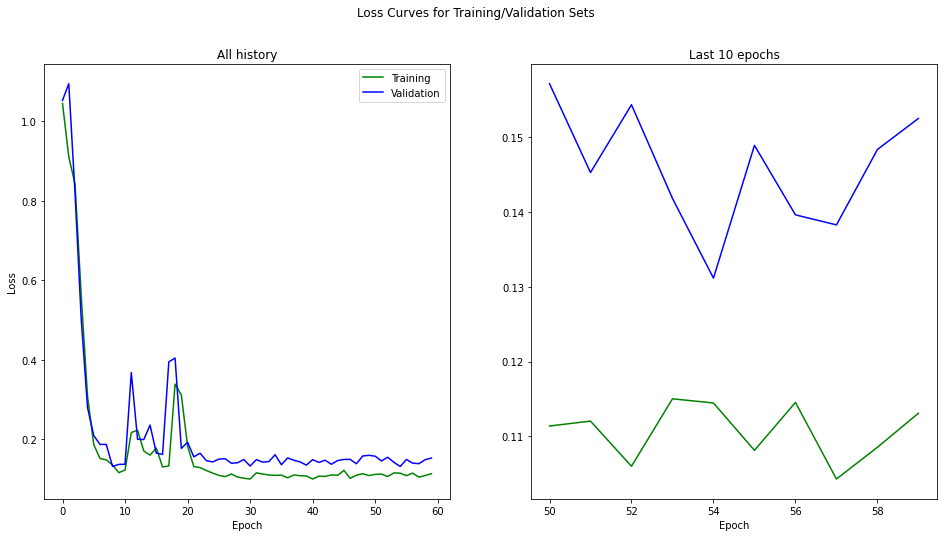

In [37]:
%autoreload
plot_loss_curves(hist_df, 10, figname="binary_classifier.png")

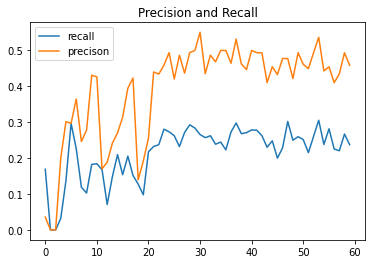

In [38]:
plt.plot(hist_df['recall'], label = 'recall')
plt.plot(hist_df['precision'], label = 'precison')
plt.title('Precision and Recall')
plt.legend()

In [43]:
classifier.save("../Models/binary_classifier")

INFO:tensorflow:Assets written to: ../Models/binary_classifier/assets


In [18]:
#already trained
classifier = keras.models.load_model("../Models/binary_classifier")

---
## Testing

In [24]:
non_lens = train_x[train_y< 0.5]
lens = train_x[train_y > 0.5]

#visualizing LENSES in the test set
fig, ax = plt.subplots(33, 16, figsize=(16*8, 33*8))

for i in range(33):
    ax[i][0].imshow(lens[8*i,...,0])
    ax[i][1].imshow(lens[8*i,...,1])
    ax[i][2].imshow(lens[8*i+1,...,0])
    ax[i][3].imshow(lens[8*i+1,...,1])
    ax[i][4].imshow(lens[8*i+2,...,0])
    ax[i][5].imshow(lens[8*i+2,...,1])
    ax[i][6].imshow(lens[8*i+3,...,0])
    ax[i][7].imshow(lens[8*i+3,...,1])
    ax[i][8].imshow(lens[8*i+4,...,0])
    ax[i][9].imshow(lens[8*i+4,...,1])
    ax[i][10].imshow(lens[8*i+5,...,0])
    ax[i][11].imshow(lens[8*i+5,...,1])
    if 8*i+6 < 262:
        ax[i][12].imshow(lens[8*i+6,...,0])
        ax[i][13].imshow(lens[8*i+6,...,1])
        ax[i][14].imshow(lens[8*i+7,...,0])
        ax[i][15].imshow(lens[8*i+7,...,1])
    
    if i == 0:
        ax[i][0].set_title('u', size = 50)                
        ax[i][1].set_title('r', size = 50)
        ax[i][2].set_title('u', size = 50)                
        ax[i][3].set_title('r', size = 50)
        ax[i][4].set_title('u', size = 50)                
        ax[i][5].set_title('r', size = 50)
        ax[i][6].set_title('u', size = 50)                
        ax[i][7].set_title('r', size = 50)
        ax[i][8].set_title('u', size = 50)                
        ax[i][9].set_title('r', size = 50)
        ax[i][10].set_title('u', size = 50)                
        ax[i][11].set_title('r', size = 50)
        ax[i][12].set_title('u', size = 50)                
        ax[i][13].set_title('r', size = 50)
        ax[i][14].set_title('u', size = 50)                
        ax[i][15].set_title('r', size = 50)  
plt.savefig('../Plots/Train_lens_all')

#visualizing test set
fig, ax = plt.subplots(7*2, 6, figsize=(60,140))

for i in range(7*2):
    ax[i][0].imshow(non_lens[3*i,...,0])
    ax[i][1].imshow(non_lens[3*i,...,1])
    ax[i][2].imshow(non_lens[3*i+1,...,0])
    ax[i][3].imshow(non_lens[3*i+1,...,1])
    ax[i][4].imshow(non_lens[3*i+2,...,0])
    ax[i][5].imshow(non_lens[3*i+2,...,1])
    if i == 0:
        ax[i][0].set_title('u', size = 50)                
        ax[i][1].set_title('r', size = 50)
        ax[i][2].set_title('u', size = 50)                
        ax[i][3].set_title('r', size = 50)
        ax[i][4].set_title('u', size = 50)                
        ax[i][5].set_title('r', size = 50)
    
plt.savefig('../Plots/Train_nonlens_notall')

(array([786.,  26.]),
 array([0. , 0.5, 1. ]),
 <BarContainer object of 2 artists>)

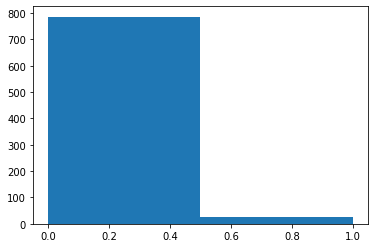

In [25]:
plt.hist(test_y, bins = 2)

In [26]:
def evaluate_model(model, x_test, y_test, threshold):
    test_loss, test_rec, test_prec = model.evaluate(x_test, y_test)
    y_predict = model.predict(x_test)
    plt.hist(y_predict)
    print("Lowest 10 scores:")
    print(sorted(y_predict)[:10])
    print()
    print("Highest 10 scores:")
    print()
    print(sorted(y_predict)[-10:])
    conf = tf.math.confusion_matrix(y_test, np.round(y_predict- threshold + 0.5)) #y_test are rows and y_pred are colums
                                                       #so bottom left is 1-0: false negative
                                                       #and top right is 0-1:  false positive
    print(f"Confusion Matrix:\n {conf}")
    print("Test loss: %.3f" % test_loss)
    print("Test precision: %3f" % test_prec)
    
#     for i in range(len(y_predict)):
#         if np.round(y_predict[i]- threshold + 0.5) != y_test[i]:
#             if y_test[i] == 0:
#                 f, ax = plt.subplots(1, 2, figsize=(4,2))
#                 ax[0].imshow(x_test[i,...,0])
#                 ax[1].imshow(x_test[i,...,1])
#                 plt.suptitle('FALSE POSITIVE, pred = '+ '%.3f'%(y_predict[i]))
#                 #plt.savefig(f'../Class/test_fp{i}')
#             if y_test[i] == 1:
#                 f, ax = plt.subplots(1, 2, figsize=(4,2))
#                 ax[0].imshow(x_test[i,...,0])
#                 ax[1].imshow(x_test[i,...,1])
#                 plt.suptitle('FALSE NEGATIVE, pred =' + '%.3f'%(y_predict[i]))
#                 #plt.savefig(f'../Class/test_fn{i}')
            
    return y_predict

26/26 [==============================] - 0s 3ms/step - loss: 0.1047 - recall: 0.1538 - precision: 0.3333  
Lowest 10 scores:
[array([1.12761846e-07], dtype=float32), array([1.5836136e-07], dtype=float32), array([8.027175e-07], dtype=float32), array([1.4250573e-06], dtype=float32), array([2.8953093e-06], dtype=float32), array([5.312281e-06], dtype=float32), array([6.7688698e-06], dtype=float32), array([9.953635e-06], dtype=float32), array([1.9600173e-05], dtype=float32), array([2.364464e-05], dtype=float32)]

Highest 10 scores:

[array([0.5240496], dtype=float32), array([0.54224086], dtype=float32), array([0.5854429], dtype=float32), array([0.6027856], dtype=float32), array([0.60810846], dtype=float32), array([0.6115367], dtype=float32), array([0.6505945], dtype=float32), array([0.83675754], dtype=float32), array([0.9535991], dtype=float32), array([0.9970816], dtype=float32)]
Confusion Matrix:
 [[751  35]
 [ 10  16]]
Test loss: 0.105
Test precision: 0.333333


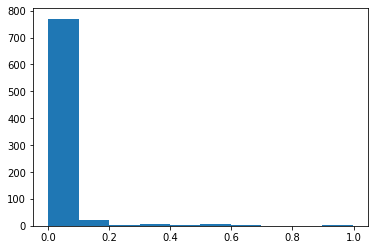

In [42]:
plt.rcParams.update({'figure.max_open_warning': 0})
pred_label = evaluate_model(classifier, test_x, test_y,  threshold =0.067795)

#### ---- 
# ROC curve
Smaller values on the x-axis of the plot indicate lower false positives and higher true negatives.
Larger values on the y-axis of the plot indicate higher true positives and lower false negatives.

In [28]:
from sklearn import metrics

Best Threshold=0.020365
No Skill: ROC AUC=0.500
Logistic: ROC AUC=0.908
Best Threshold=0.020365


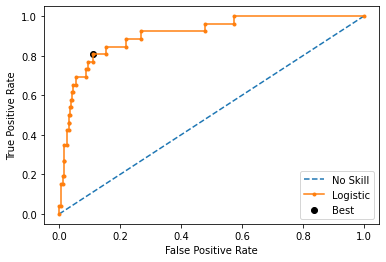

In [40]:
fpr, tpr, thresholds = metrics.roc_curve(y_true = test_y, y_score = pred_label)


# keep probabilities for the positive outcome only
#pred_label = pred_label[test_y ==1]
# get the best threshold
J = tpr - fpr
ix = np.argmax(J)
best_thresh = thresholds[ix]
print('Best Threshold=%f' % (best_thresh))

# generate a no skill prediction (majority class)
ns_probs = [0 for _ in range(len(test_y))]
ns_auc = metrics.roc_auc_score(test_y, ns_probs)
lr_auc = metrics.roc_auc_score(test_y, pred_label)
# summarize scores
print('No Skill: ROC AUC=%.3f' % (ns_auc))
print('Logistic: ROC AUC=%.3f' % (lr_auc))
# calculate roc curves
ns_fpr, ns_tpr, _ = metrics.roc_curve(test_y, ns_probs)
lr_fpr, lr_tpr, _ = metrics.roc_curve(test_y, pred_label)
print('Best Threshold=%f' % (best_thresh))
# plot the roc curve for the model
plt.plot(ns_fpr, ns_tpr, linestyle='--', label='No Skill')
plt.plot(lr_fpr, lr_tpr, marker='.', label='Logistic')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')
# axis labels
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the legend
plt.legend()
# show the plot
plt.show()


# Precision-Recall curve

Logistic: f1=0.062 auc=0.299
Best Threshold=0.067795, F-Score=0.436


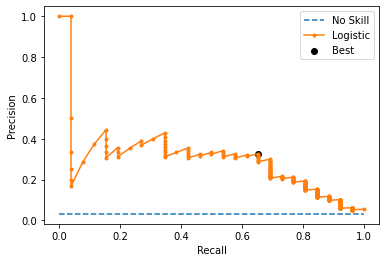

In [41]:
# precision-recall curve and f1 for an imbalanced dataset
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
# predict probabilities
lr_probs = classifier.predict_proba(test_x)
# keep probabilities for the positive outcome only
lr_probs = lr_probs[:, 0]
# predict class values
yhat = classifier.predict(test_x)
yhat[yhat<0.5] = 0
yhat[yhat<1] = 1
# calculate precision and recall for each threshold
lr_precision, lr_recall, thresholds = precision_recall_curve(test_y, lr_probs)
# calculate scores
lr_f1, lr_auc = f1_score(test_y, yhat), auc(lr_recall, lr_precision)
# summarize scores
print('Logistic: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
# plot the precision-recall curves
no_skill = len(test_y[test_y==1]) / len(test_y)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', label='No Skill')
plt.plot(lr_recall, lr_precision, marker='.', label='Logistic')
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')

# convert to f score
fscore = (2 * lr_precision * lr_recall) / (lr_precision + lr_recall)
# locate the index of the largest f score
ix = np.argmax(fscore)
print('Best Threshold=%f, F-Score=%.3f' % (thresholds[ix], fscore[ix]))
plt.scatter(lr_recall[ix], lr_precision[ix], marker='o', color='black', label='Best')



# show the legend
plt.legend()
# show the plot
plt.show()

hf_pos.close()
hf_neg.close()

---
# Classifying new cutouts

In [74]:
image_dir = "/home/anahoban/projects/rrg-kyi/astro/cfis/W3/"
scratch = "/home/anahoban/scratch/"

In [80]:
ls

 arcs_list.csv                 'Lens Binary Classifier.ipynb'
 classification_pipeline.py     mastercat/
 Classifier2.0.ipynb           'Multi-Channel Autoencoder.ipynb'
 create_class_mastercat.py      New_fcts.ipynb
 create_evaluation_cutouts.py   norm_tests.ipynb
 create_models.py               __pycache__/
 cutouts/                       script_class.sh
 func_job2.py                   script_class.sh-23152116.out
 functions.py                   Tests.ipynb
 job_scripts/                   Twobands_tests.ipynb
 labels/


In [81]:
hf = h5py.File(cutout_dir + "cutouts_filtered_64p.h5", "r")
#hf = h5py.File(cutout_dir + "random_cutouts_cfis.h5", "r")

In [82]:
hf['cutout0']

KeyError: "Unable to open object (object 'cutout0' doesn't exist)"

In [ ]:
#rnadom cutouts
n = 288
new_cutouts = np.zeros((n, 64 ,64 , 4)) #just need u and r for now
count = 0
tiles_list = list(hf.keys())
tile = tiles_list[0]
print(tile)
cutouts = list(hf.keys())
for cut in cutouts:
        new_cutouts[count,...,:2] = np.array(hf[cut])[...,[0,2]]
        count += 1          
count == n #should be True

In [ ]:
#cutouts filtered
n = 5000
new_cutouts = np.zeros((n, 64 ,64 , 4)) #just need u and r for now
count = 0
tiles_list = list(hf.keys())
tile = tiles_list[0]
print(tile)
cutouts = list(hf[tile+'/IMAGES'].keys())
for cut in cutouts:
        new_cutouts[count,...,:2] = np.array(hf[tile+'/IMAGES/'+cut])[...,[0,2]]
        count += 1          
count == n #should be True

In [ ]:
new_cutouts.shape

In [ ]:
y_predict = classifier.predict(new_cutouts)

In [ ]:
plt.hist(y_predict)

In [ ]:
pred_lens = new_cutouts[y_predict[...,0] > 0.5]
preds = y_predict[y_predict[...,0] > 0.5]
#random.Random(5).shuffle(pred_lens)
#random.Random(5).shuffle(preds)
selection = pred_lens[:100]
preds_selection = preds[:100]

In [ ]:
#visualizing LENSES in the test set
rows = 3
fig, ax = plt.subplots(rows, 10, figsize=(10*8, rows*8))

for i in range(rows):
    ax[i][0].imshow(selection[5*i,...,0])
    ax[i][1].imshow(selection[5*i,...,1])
    ax[i][2].imshow(selection[5*i+1,...,0])
    ax[i][3].imshow(selection[5*i+1,...,1])
    ax[i][4].imshow(selection[5*i+2,...,0])
    ax[i][5].imshow(selection[5*i+2,...,1])
    ax[i][6].imshow(selection[5*i+3,...,0])
    ax[i][7].imshow(selection[5*i+3,...,1])
    ax[i][8].imshow(selection[5*i+4,...,0])
    ax[i][9].imshow(selection[5*i+4,...,1])
    
    ax[i][0].set_title('u, '+'%.3f'%(preds_selection[5*i]), size = 50)                
    ax[i][1].set_title('r, '+'%.3f'%(preds_selection[5*i]), size = 50)
    ax[i][2].set_title('u, '+'%.3f'%(preds_selection[5*i+1]), size = 50)                
    ax[i][3].set_title('r, '+'%.3f'%(preds_selection[5*i+1]), size = 50)
    ax[i][4].set_title('u, '+'%.3f'%(preds_selection[5*i+2]), size = 50)                
    ax[i][5].set_title('r, '+'%.3f'%(preds_selection[5*i+2]), size = 50)
    ax[i][6].set_title('u, '+'%.3f'%(preds_selection[5*i+3]), size = 50)                
    ax[i][7].set_title('r, '+'%.3f'%(preds_selection[5*i+3]), size = 50)
    ax[i][8].set_title('u, '+'%.3f'%(preds_selection[5*i+4]), size = 50)                
    ax[i][9].set_title('r, '+'%.3f'%(preds_selection[5*i+4]), size = 50)
#plt.savefig('../Plots/new_found_lens')    

In [78]:
hf.close()